[![Binder](https://mybinder.org/badge_logo.svg)](https://notebooks.gesis.org/binder/v2/gh/jolin-io/fall-in-love-with-julia/main?filepath=13%20Julia-Python20-%2003%20Use%20Python%20with%20PyCall%20and%20PythonCall.ipynb)

<a href="https://www.jolin.io" target="_blank" rel="noreferrer noopener">
<img src="https://www.jolin.io/assets/Jolin/Jolin-Banner-Website-v1.3-darkmode.webp">
</a>

# Fall-in-love-with-Julia: Accelerating Python 101

For Julia Python interactions there are two packages:

|    | [PyCall.jl](https://github.com/JuliaPy/PyCall.jl) | [PythonCall.jl](https://github.com/cjdoris/PythonCall.jl) |
| -: | --------- | ------------- |
| pypi | with [`PyJulia`](https://github.com/JuliaPy/pyjulia) python package (simply called `julia` on pypi) | with [`JuliaCall`](https://pypi.org/project/juliacall/) python package |
| conversions | automatically converts between native types | no auto-conversion, just wrapping |
| dependencies | Global package management via `Conda.jl` | Project-separated package management via `CondaPkg.jl` |
| run python | use `py"..."` | use `@pyexec "..."` |

Outline
- [01](https://notebooks.gesis.org/binder/v2/gh/jolin-io/fall-in-love-with-julia/main?filepath=13%20Julia-Python20-%2001%20Accelerating%20Python%20with%20PyJulia.ipynb) first notebook shows how to use PyJulia
- [02](https://notebooks.gesis.org/binder/v2/gh/jolin-io/fall-in-love-with-julia/main?filepath=13%20Julia-Python20-%2002%20Accelerating%20Python%20with%20JuliaCall.ipynb) second notebook is about JuliaCall
- **[03](https://notebooks.gesis.org/binder/v2/gh/jolin-io/fall-in-love-with-julia/main?filepath=13%20Julia-Python20-%2003%20Use%20Python%20with%20PyCall%20and%20PythonCall.ipynb) using Python from Julia with PyCall**
- [special extra](https://mybinder.org/v2/gh/jolin-io/workshop-accelerate-Python-with-Julia/main?filepath=03-example-cython-vs-cpp-vs-julia.ipynb) - Julia vs C++

In [1]:
# small helper for html interaction, export @htl macro
using HypertextLiteral

In [2]:
# show plotly plot
show_plotly(fig, width="80%", height="500px") = mktempdir() do tmp 
    fig.write_html("$tmp/result.html")
    @htl """<iframe width="$width" height="$height" srcdoc="$(readchomp("$tmp/result.html"))"/>"""
end

show_plotly (generic function with 3 methods)

# PyCall

We reuse binder's default Python (and also support a local virtual env for developing this notebook locally in vscode).

In [3]:
local_venv = abspath(joinpath(Base.current_project(), "..", ".venv", "bin", "python3"))
ENV["PYTHON"] = isfile(local_venv) ? local_venv : "python3"
import PyCall
import PyCall: @py_str

In [4]:
pd = PyCall.pyimport("pandas")
pd.options.plotting.backend = "plotly"

"plotly"

In [5]:
n = 4
pdf = pd.DataFrame(Dict(:a => 1:n, :b => rand(n), :c => sin.(1:n)))

,a,b,c
0,1,0.407198,0.841471
1,2,0.609708,0.909297
2,3,0.876227,0.141120
3,4,0.728070,-0.756802


In [6]:
fig = pdf.plot(kind="bar", x="a", y="c")
show_plotly(fig)

<iframe width="80%" height="500px" srcdoc="&lt;html>
&lt;head>&lt;meta charset=&quot;utf-8&quot; />&lt;/head>
&lt;body>
    &lt;div>                        &lt;script type=&quot;text/javascript&quot;>window.PlotlyConfig = {MathJaxConfig: &apos;local&apos;};&lt;/script>
        &lt;script type=&quot;text/javascript&quot;>/**
* plotly.js v2.20.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){&quot;object&quot;==typeof exports&amp;&amp;&quot;object&quot;==typeof module?module.exports=e():&quot;function&quot;==typeof define&amp;&amp;define.amd?define([],e):&quot;object&quot;==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){&quot;use strict&quot;;var n=r(71828),i={&quot;X,X div&quot;:&apos;direction:ltr;font-family:&quot;Open Sans&quot;,verdana,arial,sans-serif;margin:0;padding:0;&apos;,&quot;X input,X button&quot;:&apos;font-family:&quot;Open Sans&quot;,verdana,arial,sans-serif;&apos;,&quot;X input:focus,X button:focus&quot;:&quot;outline:none;&quot;,&quot;X a&quot;:&quot;text-decoration:none;&quot;,&quot;X a:hover&quot;:&quot;text-decoration:none;&quot;,&quot;X .crisp&quot;:&quot;shape-rendering:crispEdges;&quot;,&quot;X .user-select-none&quot;:&quot;-webkit-user-select:none;-moz-user-select:none;-ms-user-select:none;-o-user-select:none;user-select:none;&quot;,&quot;X svg&quot;:&quot;overflow:hidden;&quot;,&quot;X svg a&quot;:&quot;fill:#447adb;&quot;,&quot;X svg a:hover&quot;:&quot;fill:#3c6dc5;&quot;,&quot;X .main-svg&quot;:&quot;position:absolute;top:0;left:0;pointer-events:none;&quot;,&quot;X .main-svg .draglayer&quot;:&quot;pointer-events:all;&quot;,&quot;X .cursor-default&quot;:&quot;cursor:default;&quot;,&quot;X .cursor-pointer&quot;:&quot;cursor:pointer;&quot;,&quot;X .cursor-crosshair&quot;:&quot;cursor:crosshair;&quot;,&quot;X .cursor-move&quot;:&quot;cursor:move;&quot;,&quot;X .cursor-col-resize&quot;:&quot;cursor:col-resize;&quot;,&quot;X .cursor-row-resize&quot;:&quot;cursor:row-resize;&quot;,&quot;X .cursor-ns-resize&quot;:&quot;cursor:ns-resize;&quot;,&quot;X .cursor-ew-resize&quot;:&quot;cursor:ew-resize;&quot;,&quot;X .cursor-sw-resize&quot;:&quot;cursor:sw-resize;&quot;,&quot;X .cursor-s-resize&quot;:&quot;cursor:s-resize;&quot;,&quot;X .cursor-se-resize&quot;:&quot;cursor:se-resize;&quot;,&quot;X .cursor-w-resize&quot;:&quot;cursor:w-resize;&quot;,&quot;X .cursor-e-resize&quot;:&quot;cursor:e-resize;&quot;,&quot;X .cursor-nw-resize&quot;:&quot;cursor:nw-resize;&quot;,&quot;X .cursor-n-resize&quot;:&quot;cursor:n-resize;&quot;,&quot;X .cursor-ne-resize&quot;:&quot;cursor:ne-resize;&quot;,&quot;X .cursor-grab&quot;:&quot;cursor:-webkit-grab;cursor:grab;&quot;,&quot;X .modebar&quot;:&quot;position:absolute;top:2px;right:2px;&quot;,&quot;X .ease-bg&quot;:&quot;-webkit-transition:background-color .3s ease 0s;-moz-transition:background-color .3s ease 0s;-ms-transition:background-color .3s ease 0s;-o-transition:background-color .3s ease 0s;transition:background-color .3s ease 0s;&quot;,&quot;X .modebar--hover>:not(.watermark)&quot;:&quot;opacity:0;-webkit-transition:opacity .3s ease 0s;-moz-transition:opacity .3s ease 0s;-ms-transition:opacity .3s ease 0s;-o-transition:opacity .3s ease 0s;transition:opacity .3s ease 0s;&quot;,&quot;X:hover .modebar--hover .modebar-group&quot;:&quot;opacity:1;&quot;,&quot;X .modebar-group&quot;:&quot;float:left;display:inline-block;box-sizing:border-box;padding-left:8px;position:relative;vertical-align:middle;white-space:nowrap;&quot;,&quot;X .modebar-btn&quot;:&quot;position:relative;font-size:16px;padding:3px 4px;height:22px;cursor:pointer;line-height:normal;box-sizing:border-box;&quot;,&quot;X .modebar-btn svg&quot;:&quot;position:relative;top:2px;&quot;,&quot;X .modebar.vertical&quot;:&quot;display:flex;flex-direction:column;flex-wrap:wrap;align-content:flex-end;max-height:100%;&quot;,&quot

### What to do if you just want to execute some python?

In [7]:
py"""
import numpy as np
# use $() to use variables from the running julia process
$pdf["sin"] = np.sin($pdf.a)
"""

NOTE that the multiline `py"""..."""` string does not have a return value.

For return values you need to use it singleline `py"..."`

In [8]:
py"$pdf[$pdf.a > 2]"

,a,b,c,sin
2,3,0.876227,0.141120,0.141120
3,4,0.728070,-0.756802,-0.756802


In [9]:
show_plotly(pdf.plot(x="a", y="sin"))

<iframe width="80%" height="500px" srcdoc="&lt;html>
&lt;head>&lt;meta charset=&quot;utf-8&quot; />&lt;/head>
&lt;body>
    &lt;div>                        &lt;script type=&quot;text/javascript&quot;>window.PlotlyConfig = {MathJaxConfig: &apos;local&apos;};&lt;/script>
        &lt;script type=&quot;text/javascript&quot;>/**
* plotly.js v2.20.0
* Copyright 2012-2023, Plotly, Inc.
* All rights reserved.
* Licensed under the MIT license
*/
/*! For license information please see plotly.min.js.LICENSE.txt */
!function(t,e){&quot;object&quot;==typeof exports&amp;&amp;&quot;object&quot;==typeof module?module.exports=e():&quot;function&quot;==typeof define&amp;&amp;define.amd?define([],e):&quot;object&quot;==typeof exports?exports.Plotly=e():t.Plotly=e()}(self,(function(){return function(){var t={98847:function(t,e,r){&quot;use strict&quot;;var n=r(71828),i={&quot;X,X div&quot;:&apos;direction:ltr;font-family:&quot;Open Sans&quot;,verdana,arial,sans-serif;margin:0;padding:0;&apos;,&quot;X input,X button&quot;:&apos;font-family:&quot;Open Sans&quot;,verdana,arial,sans-serif;&apos;,&quot;X input:focus,X button:focus&quot;:&quot;outline:none;&quot;,&quot;X a&quot;:&quot;text-decoration:none;&quot;,&quot;X a:hover&quot;:&quot;text-decoration:none;&quot;,&quot;X .crisp&quot;:&quot;shape-rendering:crispEdges;&quot;,&quot;X .user-select-none&quot;:&quot;-webkit-user-select:none;-moz-user-select:none;-ms-user-select:none;-o-user-select:none;user-select:none;&quot;,&quot;X svg&quot;:&quot;overflow:hidden;&quot;,&quot;X svg a&quot;:&quot;fill:#447adb;&quot;,&quot;X svg a:hover&quot;:&quot;fill:#3c6dc5;&quot;,&quot;X .main-svg&quot;:&quot;position:absolute;top:0;left:0;pointer-events:none;&quot;,&quot;X .main-svg .draglayer&quot;:&quot;pointer-events:all;&quot;,&quot;X .cursor-default&quot;:&quot;cursor:default;&quot;,&quot;X .cursor-pointer&quot;:&quot;cursor:pointer;&quot;,&quot;X .cursor-crosshair&quot;:&quot;cursor:crosshair;&quot;,&quot;X .cursor-move&quot;:&quot;cursor:move;&quot;,&quot;X .cursor-col-resize&quot;:&quot;cursor:col-resize;&quot;,&quot;X .cursor-row-resize&quot;:&quot;cursor:row-resize;&quot;,&quot;X .cursor-ns-resize&quot;:&quot;cursor:ns-resize;&quot;,&quot;X .cursor-ew-resize&quot;:&quot;cursor:ew-resize;&quot;,&quot;X .cursor-sw-resize&quot;:&quot;cursor:sw-resize;&quot;,&quot;X .cursor-s-resize&quot;:&quot;cursor:s-resize;&quot;,&quot;X .cursor-se-resize&quot;:&quot;cursor:se-resize;&quot;,&quot;X .cursor-w-resize&quot;:&quot;cursor:w-resize;&quot;,&quot;X .cursor-e-resize&quot;:&quot;cursor:e-resize;&quot;,&quot;X .cursor-nw-resize&quot;:&quot;cursor:nw-resize;&quot;,&quot;X .cursor-n-resize&quot;:&quot;cursor:n-resize;&quot;,&quot;X .cursor-ne-resize&quot;:&quot;cursor:ne-resize;&quot;,&quot;X .cursor-grab&quot;:&quot;cursor:-webkit-grab;cursor:grab;&quot;,&quot;X .modebar&quot;:&quot;position:absolute;top:2px;right:2px;&quot;,&quot;X .ease-bg&quot;:&quot;-webkit-transition:background-color .3s ease 0s;-moz-transition:background-color .3s ease 0s;-ms-transition:background-color .3s ease 0s;-o-transition:background-color .3s ease 0s;transition:background-color .3s ease 0s;&quot;,&quot;X .modebar--hover>:not(.watermark)&quot;:&quot;opacity:0;-webkit-transition:opacity .3s ease 0s;-moz-transition:opacity .3s ease 0s;-ms-transition:opacity .3s ease 0s;-o-transition:opacity .3s ease 0s;transition:opacity .3s ease 0s;&quot;,&quot;X:hover .modebar--hover .modebar-group&quot;:&quot;opacity:1;&quot;,&quot;X .modebar-group&quot;:&quot;float:left;display:inline-block;box-sizing:border-box;padding-left:8px;position:relative;vertical-align:middle;white-space:nowrap;&quot;,&quot;X .modebar-btn&quot;:&quot;position:relative;font-size:16px;padding:3px 4px;height:22px;cursor:pointer;line-height:normal;box-sizing:border-box;&quot;,&quot;X .modebar-btn svg&quot;:&quot;position:relative;top:2px;&quot;,&quot;X .modebar.vertical&quot;:&quot;display:flex;flex-direction:column;flex-wrap:wrap;align-content:flex-end;max-height:100%;&quot;,&quot

# PythonCall

PythonCall does not have `py"..."` string, but comes with a `@py` macro.

In [10]:
# we can reuse the same Python as PyCall uses
ENV["JULIA_PYTHONCALL_EXE"] = "@PyCall"
import PythonCall
import PythonCall: @py

While you could write
```julia
pd2 = PythonCall.pyimport("pandas")
```
just like in PyCall, you can also do

In [11]:
@py import pandas as pd2
pd2.options.plotting.backend = "matplotlib"

"matplotlib"

Because PythonCall does not autoconvert anything, we need a bit more manual work here and there.

In our example of constructing a pandas DataFrame from a julia Dict we need to:
- use Strings as keys
- use explicit transformation to Python's `dict` type

As you have seen previously, the support for transforming julia DataFrame to pandas DataFrame is better actually.

In [12]:
n = 4
pdf2 = pd2.DataFrame(PythonCall.pybuiltins.dict(
    Dict("a" => 1:n, "b" => rand(n), "c" => sin.(1:n))
))

,c,b,a
0,0.841471,0.032979,1
1,0.909297,0.326654,2
2,0.141120,0.648541,3
3,-0.756802,0.574643,4


PythonCall comes with pretty printing support for matplotlib figures

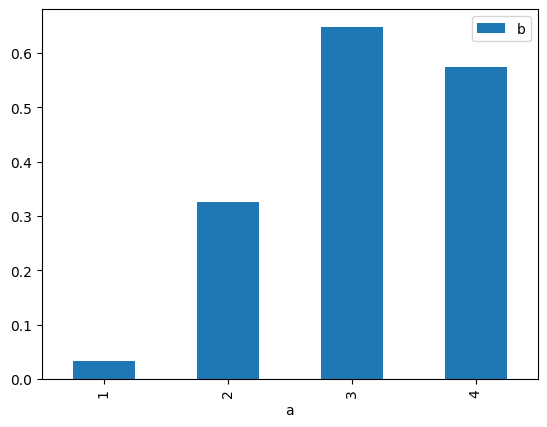

In [13]:
pdf2.plot(kind="bar", x="a", y="b").figure

In [15]:
@py pdf2[pdf2.a > 2]
# This actually also works without @py.
# Sometimes the julia interpretation is not enough and may lead to errors.
# Then using @py will probably solve the issues for you.

,c,b,a
2,0.141120,0.648541,3
3,-0.756802,0.574643,4


### Some further notes on conversions

This is specific to PythonCall. (PyCall does auto-conversion for you.)

- `PythonCall.Py(...)` transform julia value to python value (no conversion, just wrapping).
  - Everything is automatically wrapped by `Py` if you use python functions.
  - also inside `@py` everything is automatically wrapped
  - if you want to convert some julia value to a python value, then use the python constructors on the python wrappers
- `pyconvert(Type, pythonvalue)` transform python value to julia value (with conversion)


In [17]:
PythonCall.Py(" ").join(["hello", "world"])

Python: 'hello world'

or alternatively with `@py`

In [19]:
sentence = @py " ".join(["hello", "world"])

Python: 'hello world'

In [21]:
# get a real Julia String
PythonCall.pyconvert(String, sentence)

"hello world"

### Something like py"..."?

In case you just have some plain python which you want to run, use `@pyexec` and `@pyeval`.

> Note that `@pyexec`/ `@pyeval` do not support interpolation

In [113]:
PythonCall.@pyexec """
# You need global pyfun because @pyexec introduces a new local scope.
global pyfun
def pyfun(a):
    return 2*a + 9
"""

In [114]:
pyfun = PythonCall.@pyeval "pyfun"

Python: <function pyfun at 0x7f9877c83130>

# Next: [special extra, comparing C++ & Julia](https://mybinder.org/v2/gh/jolin-io/workshop-accelerate-Python-with-Julia/main?filepath=03-example-cython-vs-cpp-vs-julia.ipynb)

For questions or suggestions please contact me at stephan.sahm@jolin.io

<a href="https://www.jolin.io" target="_blank" rel="noreferrer noopener">
<img src="https://www.jolin.io/assets/Jolin/Jolin-Banner-Website-v1.3-darkmode.webp">
</a>